# Errosion Rates
In this file we:
<ol>
<li> find the average vegetation lines used as input into DSAS
<li> visualise the errosion rates calcualted by DSAS
</ol>


In [1]:
import os
import glob
import numpy as np
import pandas as pd

import rasterio
from rasterio.plot import show
from shapely.geometry import LineString
import geopandas as gpd

import matplotlib.pyplot as plt
import cv2

import numpy as np
from collections import deque
from skimage.morphology import skeletonize


# reimport 
import utils 
import importlib
importlib.reload(utils)

#reimport
import evaluation as eval
import importlib
importlib.reload(eval)

data_path = "/Users/conorosullivan/Documents/git/COASTAL_MONITORING/sentinel2-irish-coastal-segmentation/data"

In [2]:
processed_file_path = os.path.join(data_path, "processed", "meta", "processed_files.csv")
processed_files = pd.read_csv(processed_file_path)
processed_files = processed_files[processed_files["vegetation_line"] == True]
processed_files.head(5)

,ID,filename,aoi,left,top,right,bottom,date,year,vegetation_line
0,20241222T113409_tramore,S2B_MSIL2A_20241222T113409_N0511_R080_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-12-22,2024,True
1,20241127T113421_tramore,S2A_MSIL2A_20241127T113421_N0511_R080_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-11-27,2024,True
2,20241120T114401_tramore,S2A_MSIL2A_20241120T114401_N0511_R123_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-11-20,2024,True
3,20241021T114351_tramore,S2A_MSIL2A_20241021T114351_N0511_R123_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-10-21,2024,True
4,20241011T114351_tramore,S2A_MSIL2A_20241011T114351_N0511_R123_T29UPT_2...,tramore,624005.0,5783015.0,633005.0,5777015.0,2024-10-11,2024,True


In [3]:
# count by aoi and year
count = processed_files.groupby(["aoi", "year"]).size().reset_index(name='count').sort_values(by=["aoi", "year"])

# pivot so year is columns
pivot_count = count.pivot(index="aoi", columns="year", values="count").fillna(0).astype(int)
pivot_count

year,2017,2019,2020,2022,2023,2024
aoi,,,,,,
bull_island,8,11,0,0,8,0
portmarnock,8,10,0,0,0,0
portrane,0,11,8,9,0,10
rossnowlagh,0,0,0,16,0,0
tramore,0,0,0,0,0,15


In [11]:
# Points dictionary
points_dict = np.load('../data/SIVE/erosion_points_dict.npy', allow_pickle=True).item()
points_dict.keys()

dict_keys(['20240918T113321_bull_island', '20240916T114349_bull_island', '20240906T114349_bull_island', '20240814T113319_bull_island', '20240812T114351_bull_island', '20240723T114351_bull_island', '20240708T114349_bull_island', '20240623T114351_bull_island', '20240421T113321_bull_island', '20210914T113321_bull_island', '20210907T114351_bull_island', '20210828T114351_bull_island', '20210825T113321_bull_island', '20210721T113319_bull_island', '20210719T114351_bull_island', '20210716T113321_bull_island', '20210629T114351_bull_island', '20210621T113319_bull_island', '20210530T114351_bull_island', '20210507T113321_bull_island', '20210422T113309_bull_island', '20210417T113311_bull_island', '20210415T114349_bull_island', '20190920T113319_bull_island', '20190918T114351_bull_island', '20190910T113319_bull_island', '20190831T113319_bull_island', '20190826T113321_bull_island', '20190715T114359_bull_island', '20190707T113321_bull_island', '20190627T113321_bull_island', '20190421T114351_bull_island

In [5]:
# Load the model
best_model_name= "SIVE_04JUN2025_HED_BigEarthNet_trainable_guided_wBCE.pth"
model_path = f'../models/SIVE_04JUN2025/{best_model_name}'
model, meta_data = utils.get_model(model_path)

# Calculate average vegetation line

In [42]:
# Test data
target_pos = -1

test_file = '../data/SIVE/erosion/'
test_paths = glob.glob(test_file + '*.npy')
print(f"Number of test files: {len(test_paths)}")

Number of test files: 49


../data/SIVE/erosion/20170717T113321_bull_island.npy
../data/SIVE/erosion/20240623T114351_bull_island.npy
../data/SIVE/erosion/20190421T114351_bull_island.npy
../data/SIVE/erosion/20190918T114351_bull_island.npy
../data/SIVE/erosion/20210621T113319_bull_island.npy
../data/SIVE/erosion/20160513T113322_bull_island.npy
../data/SIVE/erosion/20190831T113319_bull_island.npy
../data/SIVE/erosion/20240814T113319_bull_island.npy
../data/SIVE/erosion/20160516T114402_bull_island.npy
../data/SIVE/erosion/20210825T113321_bull_island.npy
../data/SIVE/erosion/20150929T114422_bull_island.npy
../data/SIVE/erosion/20160602T113322_bull_island.npy
../data/SIVE/erosion/20210721T113319_bull_island.npy
../data/SIVE/erosion/20240906T114349_bull_island.npy
../data/SIVE/erosion/20210415T114349_bull_island.npy
../data/SIVE/erosion/20160824T114352_bull_island.npy
../data/SIVE/erosion/20170408T113321_bull_island.npy
../data/SIVE/erosion/20210828T114351_bull_island.npy
../data/SIVE/erosion/20210914T113321_bull_isla

/var/folders/_j/wkrsnnnn2lj6cds3dhhlkkh40000gn/T/ipykernel_4457/4018129928.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(10, 4))


../data/SIVE/erosion/20190826T113321_bull_island.npy
../data/SIVE/erosion/20170617T113321_bull_island.npy
../data/SIVE/erosion/20190707T113321_bull_island.npy
../data/SIVE/erosion/20170620T114351_bull_island.npy
../data/SIVE/erosion/20190413T113329_bull_island.npy
../data/SIVE/erosion/20240723T114351_bull_island.npy
../data/SIVE/erosion/20210422T113309_bull_island.npy
../data/SIVE/erosion/20190920T113319_bull_island.npy
../data/SIVE/erosion/20170930T113309_bull_island.npy
../data/SIVE/erosion/20240708T114349_bull_island.npy
../data/SIVE/erosion/20190406T114349_bull_island.npy
../data/SIVE/erosion/20210907T114351_bull_island.npy
../data/SIVE/erosion/20170712T113319_bull_island.npy
../data/SIVE/erosion/20150817T113146_bull_island.npy
../data/SIVE/erosion/20160920T113312_bull_island.npy
../data/SIVE/erosion/20240918T113321_bull_island.npy
../data/SIVE/erosion/20210507T113321_bull_island.npy
../data/SIVE/erosion/20210417T113311_bull_island.npy
../data/SIVE/erosion/20190715T114359_bull_isla

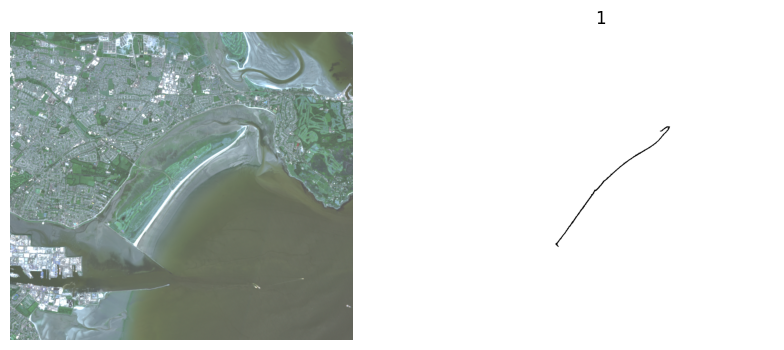

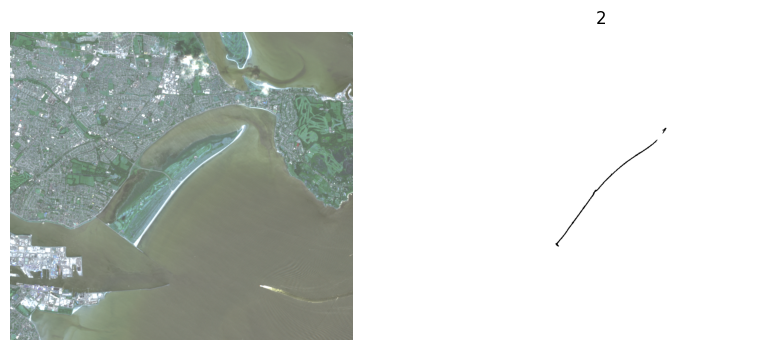

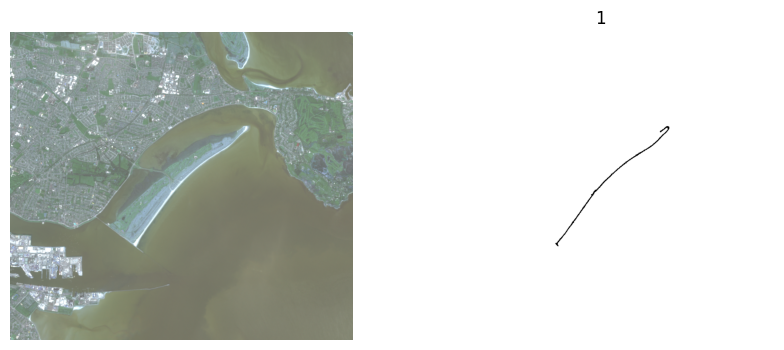

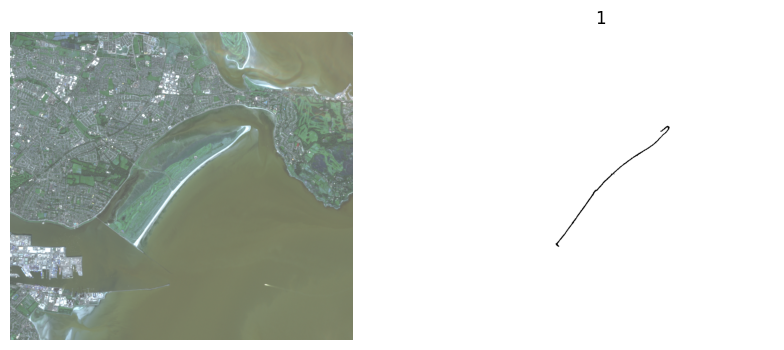

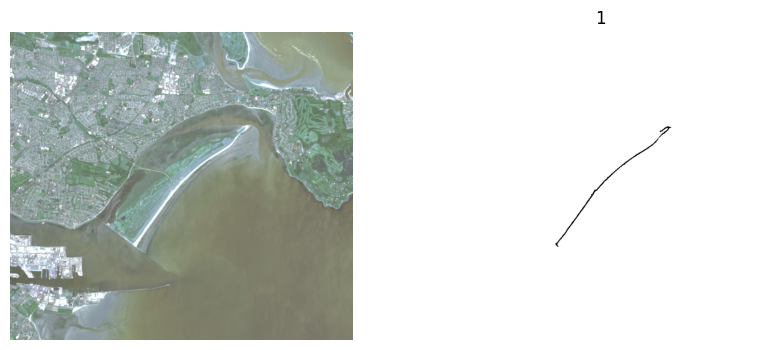

...

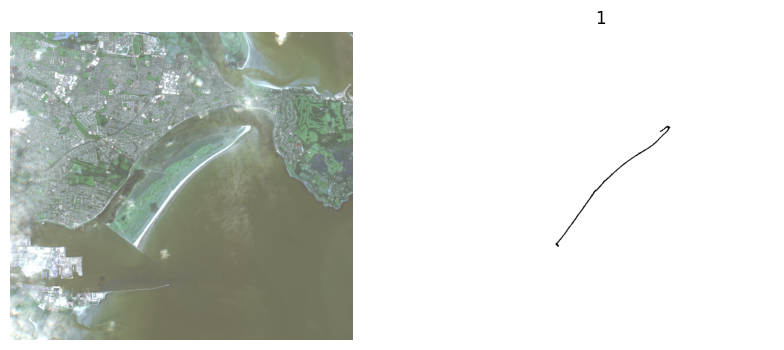

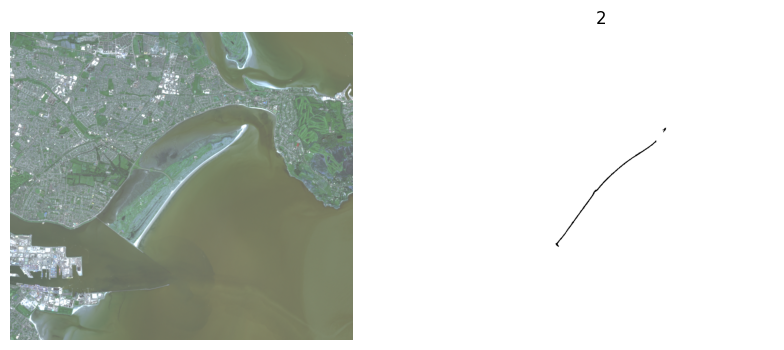

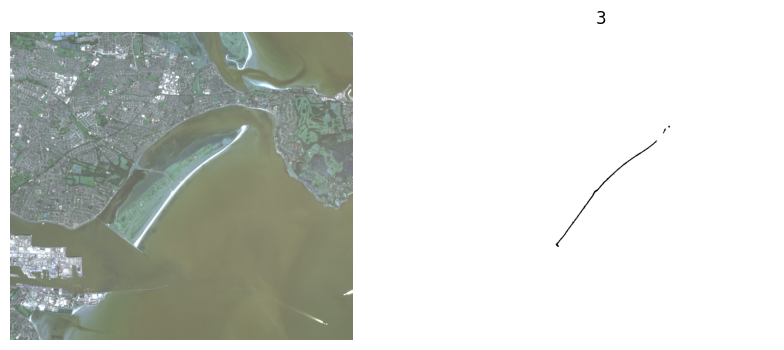

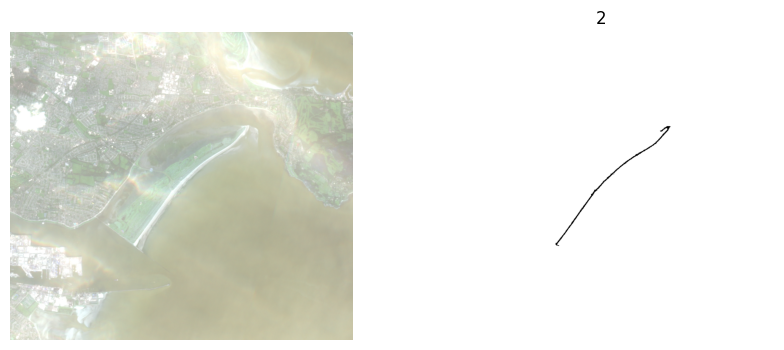

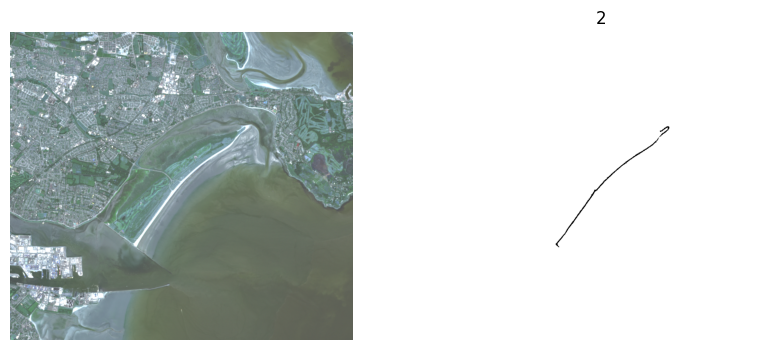

In [43]:

images = []
predictions = []
for i,path in enumerate(test_paths):

    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    print(path)
    image,  pred_full = eval.get_combined_pred(model,meta_data,points_dict, path, batch_size=1,post_process=False)
    image = image
    pred_full = pred_full

    images.append(image)
    predictions.append(pred_full)

    skeleton = utils.thin_edge_map(pred_full)

    # Label connected components
    structure = np.ones((3, 3), dtype=np.uint8)  # 8-connected neighbourhood
    labeled, num_features = label(skeleton, structure=structure)
    

    rgb = utils.get_rgb(image, contrast=0.3)

    ax[0].imshow(rgb)
    ax[1].imshow(1-pred_full,cmap='gray')
    ax[1].set_title(f"{num_features} ")

    ax[0].axis('off')
    ax[1].axis('off')

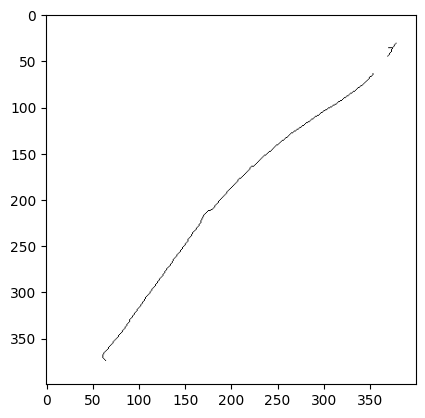

In [47]:
# Step 1: Load binary edge map (0s and 1s)
edge_map = predictions[1]
edge_map = predictions[1][250:650,300:700]

# Step 2: skeletonize the edge map
skel_edge_map = utils.thin_edge_map(edge_map)

plt.imshow(1-skel_edge_map, cmap='gray')

In [37]:
import numpy as np
from scipy.ndimage import label
from skimage.graph import route_through_array

binary_map = (skel_edge_map > 0).astype(np.uint8)

structure = np.ones((3, 3), dtype=np.uint8)  # 8-connected neighbourhood
labeled, num_features = label(binary_map, structure=structure)
num_features

2

In [44]:


def connect_components_shortest_path(binary_map):
    """
    Connect disconnected components in a binary map using the shortest path.

    Parameters:
        binary_map (numpy.ndarray): 2D array of 0s and 1s.

    Returns:
        numpy.ndarray: Updated binary map with all components connected.
    """
    # Ensure input is binary
    binary_map = (binary_map > 0).astype(np.uint8)

    # Label connected components
    structure = np.ones((3, 3), dtype=np.uint8)  # 8-connected neighbourhood
    labeled, num_features = label(binary_map, structure=structure)
    if num_features <= 1:
        return binary_map  # Already connected

    # We'll iteratively connect components until only one remains
    while num_features > 1:
        # Get coordinates of the first component
        coords1 = np.argwhere(labeled == 1)
        
        min_dist = np.inf
        best_pair = None
        
        # Compare to all other components
        for comp_id in range(2, num_features + 1):
            coords2 = np.argwhere(labeled == comp_id)

            # Compute pairwise distances (brute force)
            for p1 in coords1:
                for p2 in coords2:
                    dist = np.sum((p1 - p2) ** 2)  # squared distance
                    if dist < min_dist:
                        min_dist = dist
                        best_pair = (tuple(p1), tuple(p2))
        
        # Create a cost array where 0s have low cost and 1s have high cost
        # This ensures path goes mostly through 0s
        cost_array = np.where(binary_map == 0, 1, 10)

        # Find shortest path between the closest pixels
        start, end = best_pair
        path, _ = route_through_array(cost_array, start, end, fully_connected=True)
        path = np.array(path)

        # Set path pixels to 1
        binary_map[path[:, 0], path[:, 1]] = 1

        # Recompute connected components
        labeled, num_features = label(binary_map, structure=structure)

    return binary_map


# Example usage
if __name__ == "__main__":
    # Example binary map with two separated objects
    binary_map = np.array([
        [0,0,0,0,0,0],
        [0,1,1,0,0,0],
        [0,1,1,0,0,0],
        [0,0,0,0,1,0],
        [0,0,0,0,1,0],
        [0,0,0,0,0,0],
    ], dtype=np.uint8)

    result = connect_components_shortest_path(binary_map)
    print(result)


[[0 0 0 0 0 0]
 [0 1 1 0 0 0]
 [0 1 1 1 0 0]
 [0 0 0 1 1 0]
 [0 0 0 0 1 0]
 [0 0 0 0 0 0]]


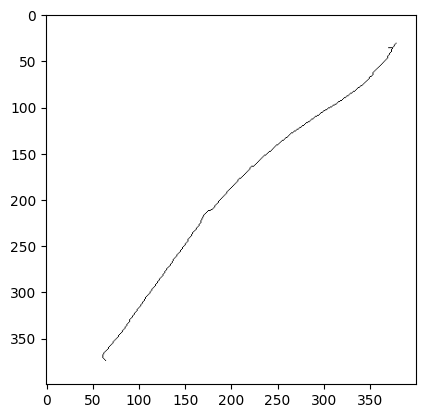

In [48]:
connected_edge_map = connect_components_shortest_path(skel_edge_map)
plt.imshow(1-connected_edge_map, cmap='gray')

In [56]:
# 8-connected neighbor offsets
NEIGHBOR_OFFSETS = [(-1, -1), (-1, 0), (-1, 1),
                    (0, -1),           (0, 1),
                    (1, -1),  (1, 0),  (1, 1)]

def build_adjacency(edge_map):
    """Build adjacency dictionary for each edge pixel in the edge map. 
    Each key is a pixel coordinate (y, x) and the value is a list of neighboring coordinates.
    """
    edge_map = edge_map.astype(np.uint8)
    coords = [tuple(c) for c in np.argwhere(edge_map > 0)] # We are interested in the edge pixels
    coord_set = set(coords)
    adj = {}
    for y, x in coords:
        neighbors = [(y+dy, x+dx) for dy, dx in NEIGHBOR_OFFSETS
                     if (y+dy, x+dx) in coord_set]
        adj[(y, x)] = neighbors
    return adj

adj = build_adjacency(skel_edge_map)
print(f"Number of edge pixels: {np.sum(skel_edge_map)}")
print(f"Number of keys {len(adj)}")

# Count number of neighbors for each pixel
neighbor_counts = {k: len(v) for k, v in adj.items()}
neighbor_counts = pd.Series(neighbor_counts).sort_values(ascending=False)
print("Neighbor counts:")
print(neighbor_counts)
print(f"Number of pixels with 1 neighbor: {np.sum(neighbor_counts == 1)}")
print(f"Number of pixels with 2 neighbors: {np.sum(neighbor_counts == 2)}")
print(f"Number of pixels with 3 neighbors: {np.sum(neighbor_counts == 3)}")
print(f"Number of pixels with 4 neighbors: {np.sum(neighbor_counts == 4)}")
print(f"Number of pixels with 5 neighbors: {np.sum(neighbor_counts == 5)}")

Number of edge pixels: 433
Number of keys 433
Neighbor counts:
28   387    4
162  226    3
     227    3
161  227    3
27   386    3
           ..
113  287    2
163  228    1
39   361    1
26   389    1
376  66     1
Length: 433, dtype: int64
Number of pixels with 1 neighbor: 4
Number of pixels with 2 neighbors: 422
Number of pixels with 3 neighbors: 6
Number of pixels with 4 neighbors: 1
Number of pixels with 5 neighbors: 0


[(26, 389), (39, 361), (163, 228), (376, 66)]


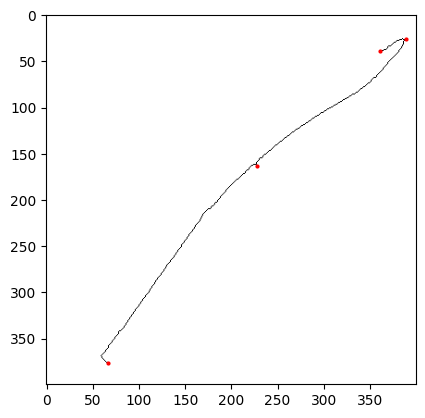

In [ ]:
def find_endpoints(adj):
    """Return list of endpoints. These are edge pixels with exactly 1 neighbor."""
    return [p for p, nbrs in adj.items() if len(nbrs) == 1]
endpoints = find_endpoints(adj)

print(endpoints)
plt.imshow(1-skel_edge_map, cmap='gray')
# plot endpoints in red
for y, x in endpoints:
    plt.plot(x, y, 'ro', markersize=2)

Longest path length: 428


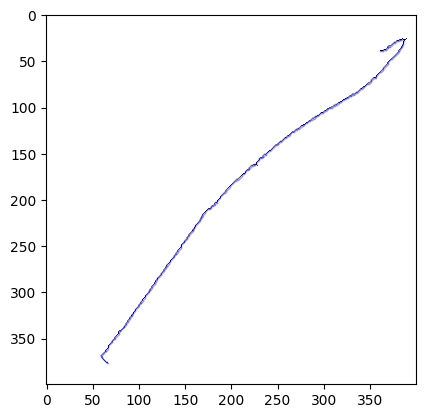

In [89]:
def bfs_longest_path(adj, start):
    """Breadth-first search to find the longest path from a starting point."""

    visited = {start: None} # Dictionary to track visited nodes and their parents
    q = deque([start]) # Initialize the queue with the starting node
    while q:
        node = q.popleft() # Get the next node from the queue
        for nbr in adj[node]:  # Iterate over neighbors of the node 
            if nbr not in visited: 
                visited[nbr] = node 
                q.append(nbr)

    # Farthest node found
    farthest = node # the farthest node will be the last node processed

    # Reconstruct path. This will be the longest path from the start node. 
    path = []
    while farthest is not None:
        path.append(farthest)
        farthest = visited[farthest]
    return path[::-1]  # Return the path in the correct order (from start to farthest node)

  # Start from the first endpoint
start = endpoints[3]
path = bfs_longest_path(adj, start)
print(f"Longest path length: {len(path)}")
plt.imshow(1-skel_edge_map, cmap='gray')
# Plot the longest path in blue
for y, x in path:
    # plot sqaure markers
    plt.plot(x, y, 'bs', markersize=0.1)

#save as svg
plt.savefig('longest_path.svg', format='svg', bbox_inches='tight', dpi=300)
plt.show()
    

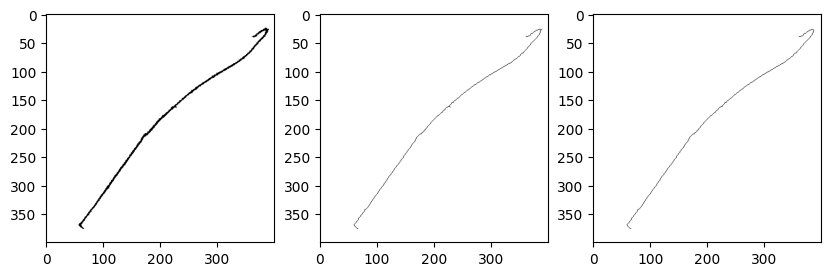

In [ ]:
def clean_edge_skeleton(skel):
    """
    Remove tangents/junctions from skeleton to produce:
    - exactly 2 endpoints
    - all other points have degree 2
    Returns:
        cleaned_skel (binary array)
        ordered_coords (list of (y, x) pixels from endpoint to endpoint)
    """
    adj = build_adjacency(skel)
    endpoints = find_endpoints(adj)
    if len(endpoints) < 2:
        raise ValueError(f"Expected at least 2 endpoints, found {len(endpoints)}")

    # Find the longest path from any endpoint. The longest line should connect the real endpoints.
    max_path = []
    for ep in endpoints:
        path = bfs_longest_path(adj, ep)
        if len(path) > len(max_path):
            max_path = path

    # Keep only pixels in longest path
    cleaned = np.zeros_like(skel, dtype=np.uint8)
    for y, x in max_path:
        cleaned[y, x] = 1

    return cleaned, max_path



cleaned_edge, ordered_coords = clean_edge_skeleton(skel_edge_map)

fig,ax = plt.subplots(1, 3, figsize=(10, 5))
ax[0].imshow(1-edge_map, cmap='gray')
ax[1].imshow(1-skel_edge_map, cmap='gray')
ax[2].imshow(1-cleaned_edge, cmap='gray')


In [95]:
raster_path = "../data/processed/aoi_stacked/bull_island/2017/20170717T113321_bull_island.tif"

edge_map = predictions[0]
skel_edge_map = skeletonize(edge_map)
cleaned_edge, ordered_coords = clean_edge_skeleton(skel_edge_map)

# Convert pixel coordinates to utm coordinates
def pixel_to_utm(pixel_coords, raster_path):
    """
    Convert pixel coordinates to utm coordinates using the raster transform.
    """
    with rasterio.open(raster_path) as src:

        utm_coords = []
        for y,x in pixel_coords:
            utm_x, utm_y = src.xy(y,x)  # Note: rasterio uses (row, col) order
            utm_coords.append((utm_x, utm_y))

        crs = src.crs  # Get the CRS from the raster file

        return utm_coords, crs

# Convert pixel coordinates to (lon, lat) coordinates
utm_coords,crs = pixel_to_utm(ordered_coords, raster_path)
# Create a LineString from the (lon, lat) coordinates
line = LineString(utm_coords)
line_gdf = gpd.GeoDataFrame(geometry=[line], crs=crs)
# Save the LineString to a shapefile
output_path = "testline.shp"
line_gdf.to_file(output_path, driver='ESRI Shapefile')

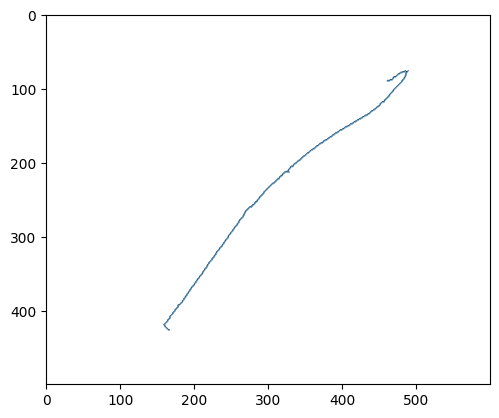

In [56]:
lines = [LineString(contour[:, 0, ::-1]) for contour in contours]  # swap (row, col) to (x, y)

plt.imshow(1-edge_map,cmap='gray')  # Invert for visualization

# Step 4: Visualize
for line in lines:
    x, y = line.xy

    plt.plot(y, x,alpha=0.5, linewidth=1)

In [17]:


# Step 5: Create a single LineString (or multiple lines if needed)
# This simple example creates one connected line (order may be arbitrary)
#line = LineString(coords)

# Convert each contour to a LineString in real-world coordinates
lines = []
for contour in contours:
    # contour: N x 2 array of (row, col) float coordinates
    # Convert each (row, col) to (x, y)
    coords = [rasterio.transform.xy(transform, r, c, offset='center') for r, c in contour]
    line = LineString(coords)
    if line.is_valid:
        lines.append(line)

# Step 6: Save to shapefile
gdf = gpd.GeoDataFrame(geometry=[line], crs=crs)

gdf.to_file("vegetation_line_test.shp")
gdf

ValueError: not enough values to unpack (expected 2, got 1)

<Axes: >

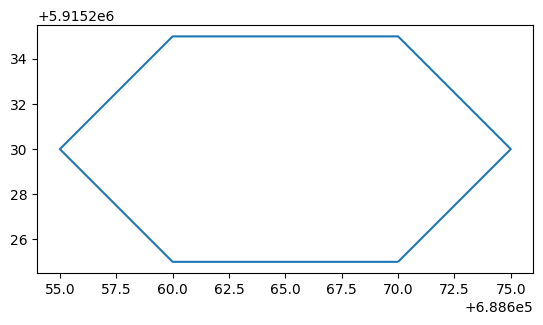

In [10]:
gdf.plot()

In [5]:
processed_files["month"] = pd.to_datetime(processed_files["date"]).dt.month
bull_island = processed_files[(processed_files["aoi"] == "bull_island")&
                              (processed_files["month"] >=4 ) &
                              (processed_files["month"] <= 9)]

# Count the number of files per month
monthly_counts = bull_island.groupby("year").size().reset_index(name='count')
print(monthly_counts)

   year  count
0  2017      4
1  2019      6
2  2023      4


In [ ]:
bull_island_2017 = processed_files[processed_files["aoi"] 

# Vegetation lines

In [5]:
import geopandas as gpd

# Load the shapefile
shapefile_path = "../data/QGIS/Vegetation Lines Howth/vegetation_lines_howth.shp"  # Update with actual path
gdf = gpd.read_file(shapefile_path)
# order by 'id' column
gdf.sort_values(by=["ID","line"], inplace=True)

#Remove ID == 'STOP'
gdf = gdf[gdf['ID'] != 'STOP']

# Remove ID = '20160605T114352' as line is short due to clouds
gdf = gdf[gdf['ID'] != '20160605T114352']

gdf['year'] = gdf['ID'].astype(str).str[:4].astype(int)

# Year >= 2016
gdf = gdf[gdf['year'] >= 2016]

# Display the first few rows
gdf.head()

,ID,line,geometry,year
34,20160513T113322,1.0,"LINESTRING (688613.335 5915252.555, 688607.852...",2016
35,20160513T113322,2.0,"LINESTRING (691345.494 5920826.527, 691349.606...",2016
32,20160516T114402,1.0,"LINESTRING (688624.351 5915267.948, 688621.102...",2016
33,20160516T114402,2.0,"LINESTRING (691339.098 5920802.312, 691328.133...",2016
30,20160602T113322,1.0,"LINESTRING (688617.432 5915257.908, 688611.964...",2016


In [7]:
# Line == 1
gdf_line1 = gdf[gdf['line'] == 1]

# calculate length of each line
gdf_line1['length'] = gdf_line1.geometry.length

gdf_line1

/Users/conorosullivan/Documents/git/COASTAL_MONITORING/sentinel2-irish-coastal-segmentation/SICS/lib/python3.11/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


,ID,line,geometry,year,length
34,20160513T113322,1.0,"LINESTRING (688613.335 5915252.555, 688607.852...",2016,5290.166734
32,20160516T114402,1.0,"LINESTRING (688624.351 5915267.948, 688621.102...",2016,5162.961172
30,20160602T113322,1.0,"LINESTRING (688617.432 5915257.908, 688611.964...",2016,5286.301478
26,20160824T114352,1.0,"LINESTRING (688617.839 5915258.179, 688614.248...",2016,5238.590932
24,20160920T113312,1.0,"LINESTRING (688622.588 5915265.641, 688619.274...",2016,5217.368379
22,20240421T113321,1.0,"LINESTRING (688615.94 5915256.415, 688607.395 ...",2024,4970.069915
20,20240516T113319,1.0,"LINESTRING (688621.909 5915264.285, 688617.218...",2024,4939.428046
18,20240623T114351,1.0,"LINESTRING (688627.743 5915273.103, 688625.67 ...",2024,4933.015262
16,20240708T114349,1.0,"LINESTRING (688621.909 5915264.692, 688618.246...",2024,4976.086588
14,20240723T114351,1.0,"LINESTRING (688629.778 5915276.088, 688608.772...",2024,4888.831995


In [14]:
# Average lines
from shapely.geometry import LineString
import numpy as np
import geopandas as gpd

def interpolate_line_relative(line, num_points=5000):
    # Interpolate points based on relative distance along the line (0 to 1)
    relative_distances = np.linspace(0, 1, num_points)
    return [line.interpolate(rd * line.length) for rd in relative_distances]

def average_lines(gdf_year, num_points=5000):
    all_coords = []
    for line in gdf_year.geometry:
        points = interpolate_line_relative(line, num_points)
        coords = np.array([[pt.x, pt.y] for pt in points])
        all_coords.append(coords)

    # Stack and average
    all_coords = np.stack(all_coords)  # (n_lines, n_points, 2)
    avg_coords = np.mean(all_coords, axis=0)

    return LineString(avg_coords)

# Generate average lines for 2016 and 2024
avg_lines = []
for year in [2016, 2024]:
    gdf_year = gdf_line1[gdf_line1['year'] == year]
    avg_line = average_lines(gdf_year, num_points=10000)
    avg_lines.append({'year': year, 'geometry': avg_line})

avg_gdf = gpd.GeoDataFrame(avg_lines, crs=gdf.crs)

In [15]:
# Save the average lines to a shapefile
output_shapefile_path = "../data/QGIS/Vegetation Lines Howth/average_lines.shp"
avg_gdf.to_file(output_shapefile_path, driver='ESRI Shapefile')
# Display the average lines

# Plot lines on top of the image

In [7]:
filename = 'S2A_MSIL2A_20240623T114351_N0510_R123_T29UPV_20240623T164349'
aoi_path = f"../data/processed/aoi_crop/{filename}_AOI.tif"

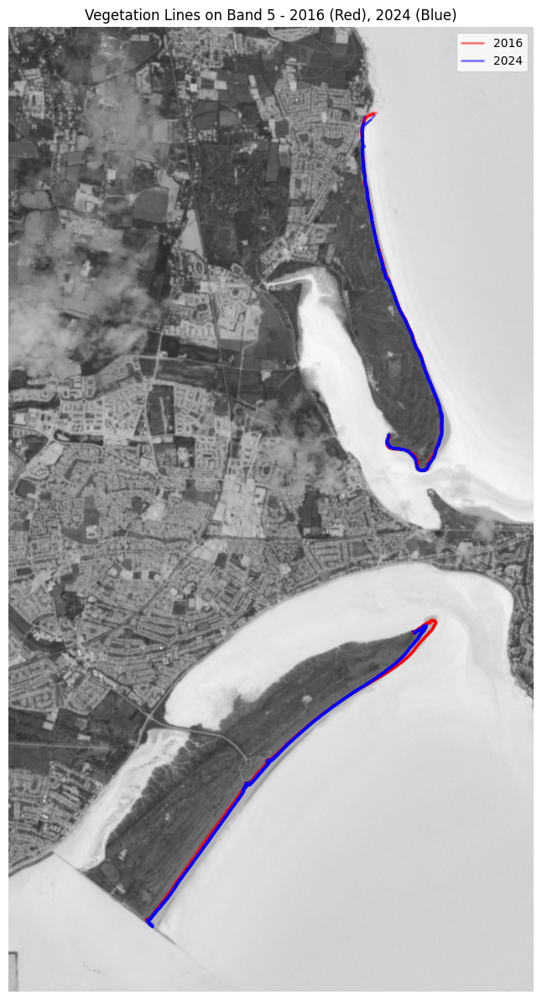

In [9]:
band_index = 5  # <- Change this to the band you want to display (1-based index)


# Filter for years 2016 and 2024
gdf_filtered = gdf[gdf['year'].isin([2016, 2024])]

# --- Open the raster and plot ---
with rasterio.open(aoi_path) as src:
    # Reproject GeoDataFrame to match raster CRS if needed
    if gdf_filtered.crs != src.crs:
        gdf_filtered = gdf_filtered.to_crs(src.crs)

    fig, ax = plt.subplots(figsize=(12, 12))
    
    # Read and show the selected band
    band = src.read(band_index)
    show(band, ax=ax, transform=src.transform, cmap='gray')

    # Plot 2016 lines in red
    gdf_filtered[gdf_filtered['year'] == 2016].plot(ax=ax, 
                                                    edgecolor='red', 
                                                    linewidth=2, 
                                                    label='2016',
                                                    alpha=0.5)

    # Plot 2024 lines in blue
    gdf_filtered[gdf_filtered['year'] == 2024].plot(ax=ax, 
                                                    edgecolor='blue', 
                                                    linewidth=2, 
                                                    label='2024',
                                                    alpha=0.5)

    # Final plot touches
    plt.legend()
    plt.title(f"Vegetation Lines on Band {band_index} - 2016 (Red), 2024 (Blue)")
    plt.axis('off')
    plt.tight_layout()
    plt.show()